In [1]:
# !python3 -m venv venv
# !source venv/bin/activate

In [2]:
# !pip install opencv-python matplotlib seaborn tensorflow
# !pip install "numpy<2"

In [3]:
!python -m pip install tensorflow-metal==1.2.0

In [4]:
import tensorflow as tf
print("TF version:", tf.__version__)
print("Physical devices:", tf.config.list_physical_devices())
print("GPUs:", tf.config.list_physical_devices('GPU'))


TF version: 2.19.0
Physical devices: [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [27]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import random
from pathlib import Path
from collections import defaultdict

In [6]:
from pathlib import Path

# base_dir_raw = Path("Dataset for Crop Pest and Disease Detection/CCMT Dataset-Augmented")
base_dir_raw = Path("Dataset for Crop Pest and Disease Detection/Raw Data/CCMT Dataset")
crop_folders_raw = [f for f in base_dir_raw.iterdir() if f.is_dir()]
print("Crops in Raw Data:", [crop.name for crop in crop_folders_raw])


Crops in Raw Data: ['Cassava', 'Tomato', 'Cashew', 'Maize']


In [7]:
from collections import defaultdict

image_count_raw = defaultdict(int)
class_count_raw = {}

for crop in crop_folders_raw:
    diseases = list(crop.glob("*"))
    print(f"\nCrop: {crop.name}")
    for disease in diseases:
        num_images = len(list(disease.glob("*.jpg")))
        print(f"  - {disease.name}: {num_images} images")
        image_count_raw[crop.name] += num_images
        class_count_raw[f"{crop.name}/{disease.name}"] = num_images



Crop: Cassava
  - mosaic: 1205 images
  - healthy: 1193 images
  - green mite: 1015 images
  - bacterial blight: 2614 images
  - brown spot: 1481 images

Crop: Tomato
  - healthy: 470 images
  - leaf blight: 1301 images
  - verticulium wilt: 773 images
  - leaf curl: 518 images
  - septoria leaf spot: 2743 images

Crop: Cashew
  - red rust: 1682 images
  - gumosis: 392 images
  - anthracnose: 1729 images
  - healthy: 1368 images
  - leaf miner: 1378 images

Crop: Maize
  - leaf beetle: 948 images
  - healthy: 208 images
  - leaf blight: 1006 images
  - grasshoper: 673 images
  - fall armyworm: 285 images
  - streak virus: 979 images
  - leaf spot: 1259 images


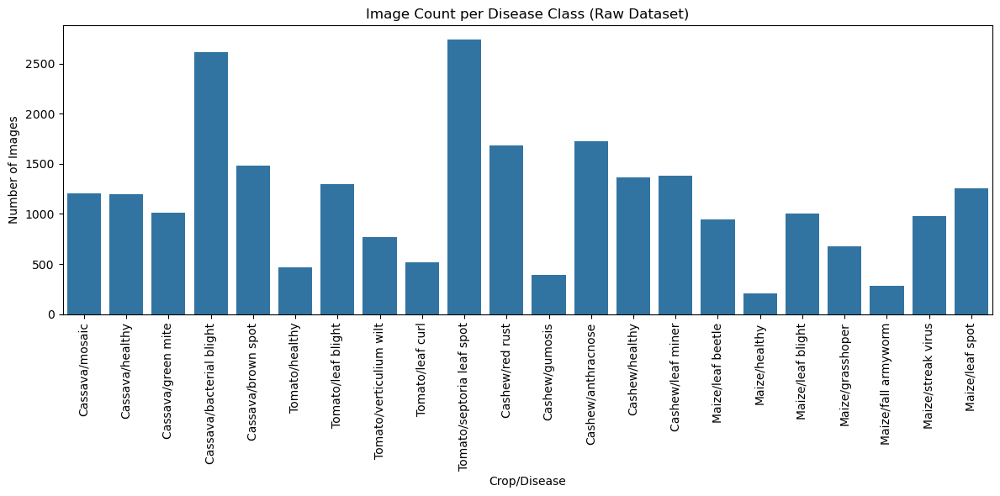

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.barplot(x=list(class_count_raw.keys()), y=list(class_count_raw.values()))
plt.xticks(rotation=90)
plt.title("Image Count per Disease Class (Raw Dataset)")
plt.ylabel("Number of Images")
plt.xlabel("Crop/Disease")
plt.tight_layout()
plt.show()


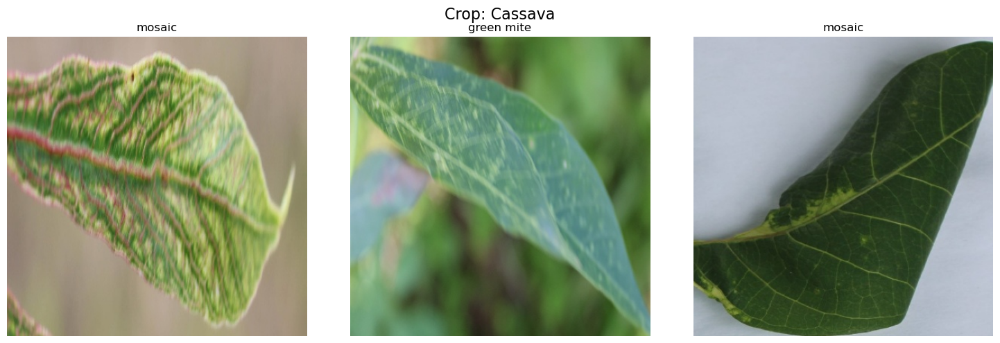

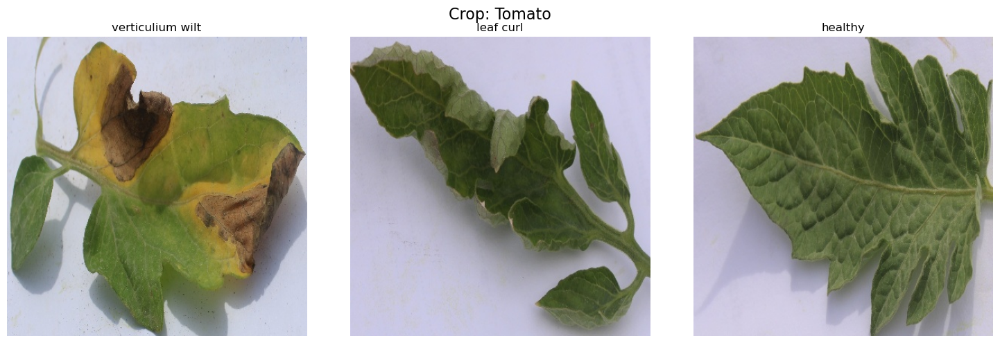

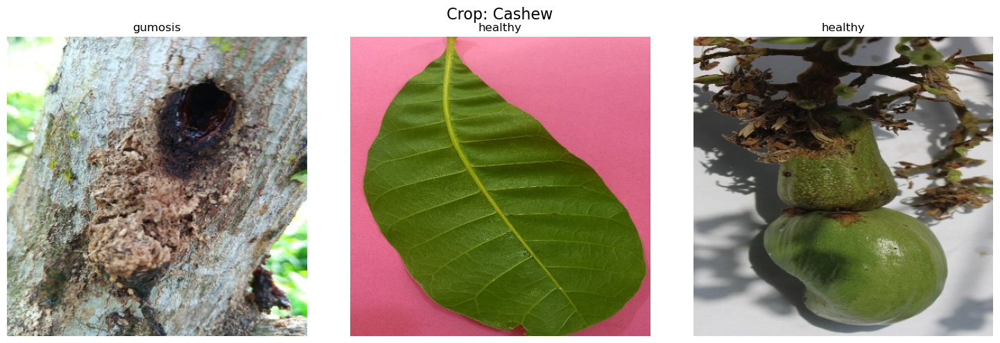

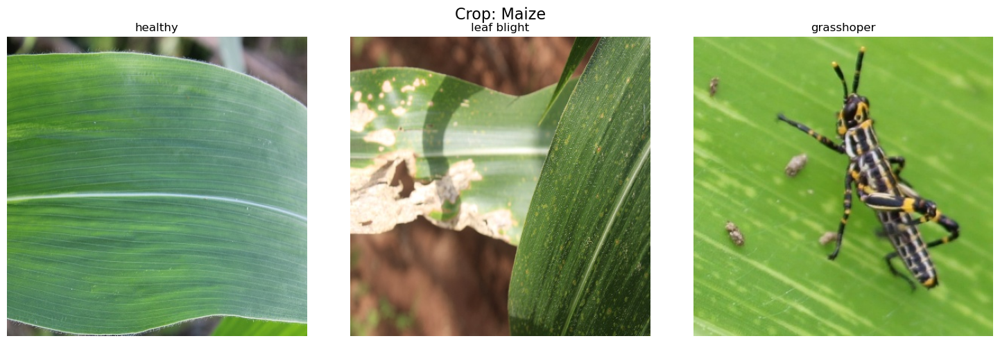

In [9]:
import random
import matplotlib.pyplot as plt
import cv2
from pathlib import Path

def show_random_images_raw(base_dir_raw, crops, num_samples=3):
    for crop in crops:
        crop_path = base_dir_raw / crop
        diseases = [d for d in crop_path.iterdir() if d.is_dir()]
        fig, axs = plt.subplots(1, num_samples, figsize=(15, 5))
        fig.suptitle(f"Crop: {crop}", fontsize=16)

        for ax in axs:
            disease = random.choice(diseases)
            
            # Support multiple image extensions
            image_files = list(disease.glob("*.jpg")) + list(disease.glob("*.jpeg")) + list(disease.glob("*.png"))
            if not image_files:
                ax.set_title("No images")
                ax.axis('off')
                continue
            
            image_path = random.choice(image_files)
            img = cv2.imread(str(image_path))

            if img is None:
                ax.set_title("Failed to load")
                ax.axis('off')
                continue

            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax.imshow(img)
            ax.set_title(disease.name)
            ax.axis('off')

        plt.tight_layout()
        plt.show()
show_random_images_raw(base_dir_raw, [crop.name for crop in crop_folders_raw])


In [10]:
from pathlib import Path

base_dir_aug = Path("Dataset for Crop Pest and Disease Detection/CCMT Dataset-Augmented")
crop_folders_aug = [f for f in base_dir_aug.iterdir() if f.is_dir()]
print("Crops in Augmented Data:", [crop.name for crop in crop_folders_aug])


Crops in Augmented Data: ['Cassava', 'Tomato', 'Cashew', 'Maize']


In [11]:
import os
import shutil
from pathlib import Path

def clean_misnamed_folders(base_dir, crops, split='train_set'):
    for crop in crops:
        crop_path = base_dir / crop / split
        for folder in crop_path.glob("*"):
            name = folder.name
            # Remove trailing digits (e.g. 'anthracnose3102' -> 'anthracnose')
            cleaned_name = ''.join([c for c in name if not c.isdigit()]).strip()
            new_path = crop_path / cleaned_name

            if new_path != folder:
                print(f"Renaming/Merging: {folder.name} -> {cleaned_name}")
                if not new_path.exists():
                    shutil.move(str(folder), str(new_path))
                else:
                    # Merge all files from old folder to cleaned folder
                    for file in folder.iterdir():
                        if file.is_file():
                            shutil.move(str(file), str(new_path / file.name))
                    # Try to remove old folder if it's now empty
                    if not any(folder.iterdir()):
                        os.rmdir(folder)
                    else:
                        print(f"Warning: Could not remove non-empty folder: {folder}")

# Example usage
# Assuming crop_folders_aug is a list of Path objects like: [Path("Cassava"), Path("Tomato"), ...]
from pathlib import Path

crop_folders_aug = list((Path("Dataset for Crop Pest and Disease Detection/CCMT Dataset-Augmented")).glob("*"))

clean_misnamed_folders(
    base_dir=Path("Dataset for Crop Pest and Disease Detection/CCMT Dataset-Augmented"),
    crops=[crop.name for crop in crop_folders_aug],
    split="train_set"
)


Renaming/Merging: bacterial blight3241 -> bacterial blight
Renaming/Merging: anthracnose3102 -> anthracnose
Renaming/Merging: red rust4751 -> red rust
Renaming/Merging: leaf miner3466 -> leaf miner
Renaming/Merging: healthy5877 -> healthy
Renaming/Merging: gumosis1714 -> gumosis


In [12]:
from collections import defaultdict
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import random

# Set base path
aug_base_dir = Path("Dataset for Crop Pest and Disease Detection/CCMT Dataset-Augmented")

# Get crop folders from augmented directory
crop_folders_aug = [f for f in aug_base_dir.iterdir() if f.is_dir()]
print("Crops in Augmented:", [crop.name for crop in crop_folders_aug])

# Initialize counters
image_count_aug_train_only = defaultdict(int)
class_count_aug_train_only = {}

valid_exts = [".jpg", ".jpeg", ".png"]

for crop in crop_folders_aug:
    train_set_dir = crop / "train_set"
    if not train_set_dir.exists():
        continue
    disease_dirs = [d for d in train_set_dir.iterdir() if d.is_dir()]
    
    print(f"\nCrop: {crop.name}")
    for disease in disease_dirs:
        num_images = len([
            f for f in disease.rglob("*")
            if f.is_file() and f.suffix.lower() in valid_exts
        ])
        print(f"  - {disease.name}: {num_images} images")
        image_count_aug_train_only[crop.name] += num_images
        class_key = f"{crop.name}/{disease.name}"
        class_count_aug_train_only[class_key] = num_images
    print(f"  - Total (train_set): {image_count_aug_train_only[crop.name]} images")





Crops in Augmented: ['Cassava', 'Tomato', 'Cashew', 'Maize']

Crop: Cassava
  - mosaic: 2250 images
  - healthy: 2271 images
  - green mite: 3246 images
  - bacterial blight: 9195 images
  - brown spot: 3250 images
  - Total (train_set): 20212 images

Crop: Tomato
  - healthy: 2000 images
  - leaf blight: 5200 images
  - verticulium wilt: 3100 images
  - leaf curl: 2050 images
  - septoria leaf spot: 9373 images
  - Total (train_set): 21723 images

Crop: Cashew
  - red rust: 4751 images
  - gumosis: 1714 images
  - anthracnose: 3102 images
  - healthy: 5877 images
  - leaf miner: 3466 images
  - Total (train_set): 18910 images

Crop: Maize
  - leaf beetle: 3789 images
  - healthy: 830 images
  - leaf blight: 4025 images
  - grasshoper: 2575 images
  - fall armyworm: 1140 images
  - streak virus: 4043 images
  - leaf spot: 3024 images
  - Total (train_set): 19426 images


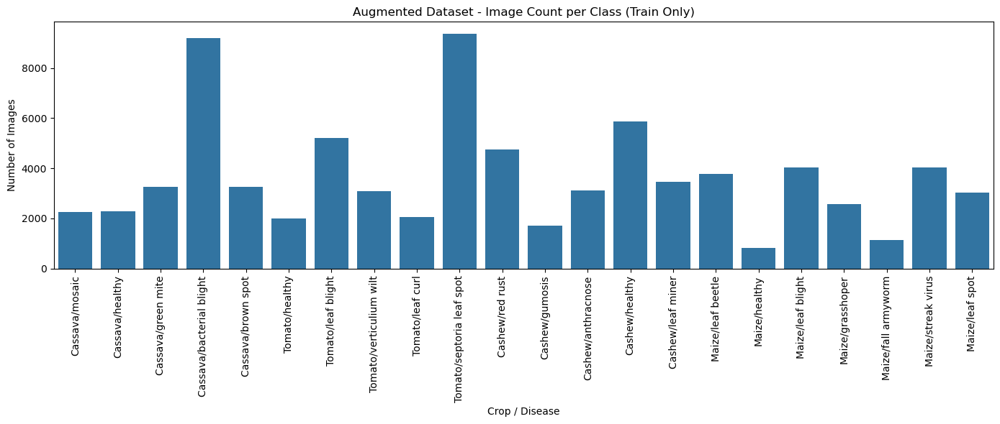

In [13]:
# Plot bar chart for class distribution
plt.figure(figsize=(14, 6))
sns.barplot(x=list(class_count_aug_train_only.keys()), y=list(class_count_aug_train_only.values()))
plt.xticks(rotation=90)
plt.title("Augmented Dataset - Image Count per Class (Train Only)")
plt.ylabel("Number of Images")
plt.xlabel("Crop / Disease")
plt.tight_layout()
plt.show()

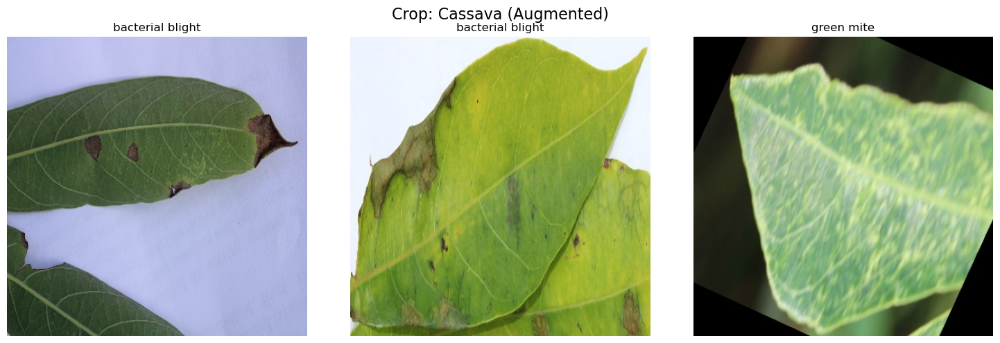

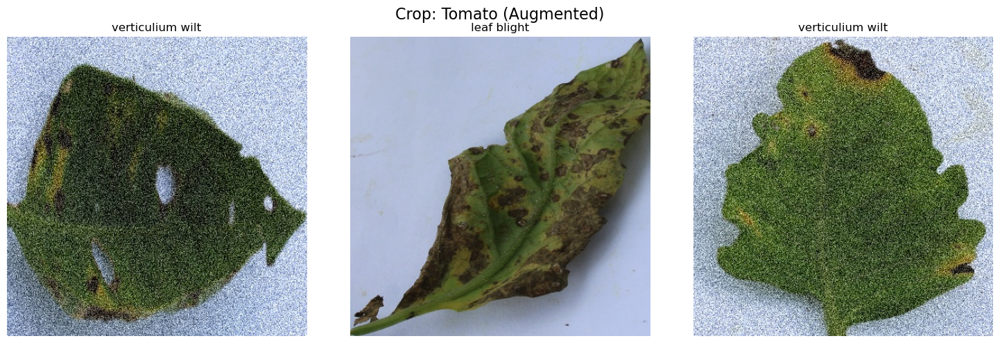

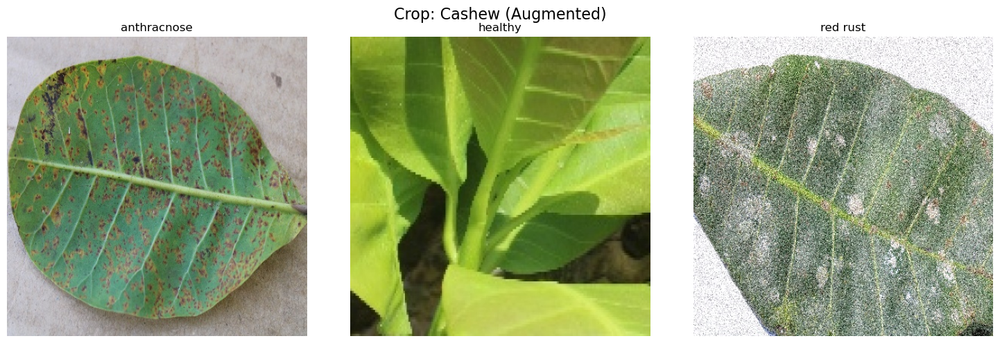

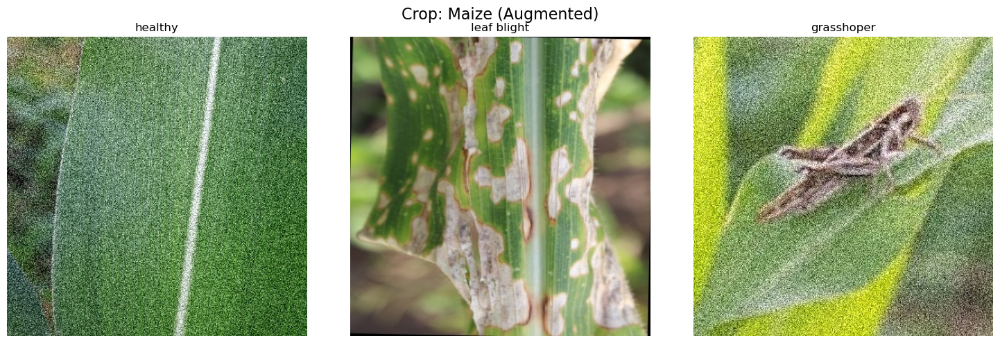

In [14]:
import random
import cv2
import matplotlib.pyplot as plt

def show_random_images_aug(aug_base_dir, crops, num_samples=3):
    valid_exts = [".jpg", ".jpeg", ".png"]

    for crop in crops:
        disease_dirs = list((aug_base_dir / crop / "train_set").glob("*"))
        fig, axs = plt.subplots(1, num_samples, figsize=(15, 5))
        fig.suptitle(f"Crop: {crop} (Augmented)", fontsize=16)

        for ax in axs:
            disease = random.choice(disease_dirs)

            # Get all valid image files (case-insensitive)
            images = [f for f in disease.iterdir() if f.suffix.lower() in valid_exts and f.is_file()]
            if not images:
                ax.set_title("No images found")
                ax.axis('off')
                continue

            image_path = random.choice(images)
            img = cv2.imread(str(image_path))
            if img is None:
                ax.set_title("Unreadable image")
                ax.axis('off')
                continue

            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax.imshow(img)
            ax.set_title(disease.name)
            ax.axis('off')

        plt.tight_layout()
        plt.show()

# Usage
show_random_images_aug(aug_base_dir, [crop.name for crop in crop_folders_aug])


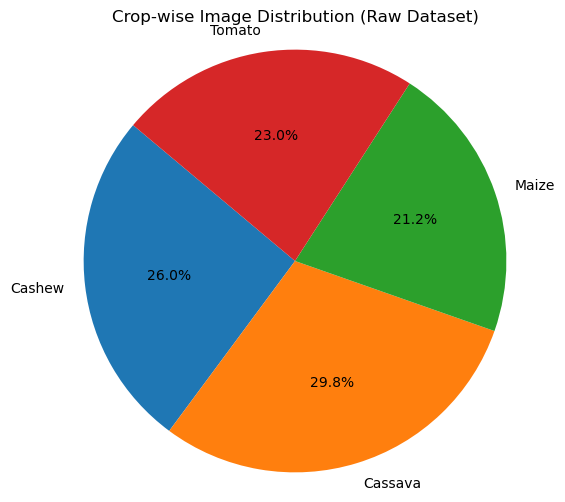

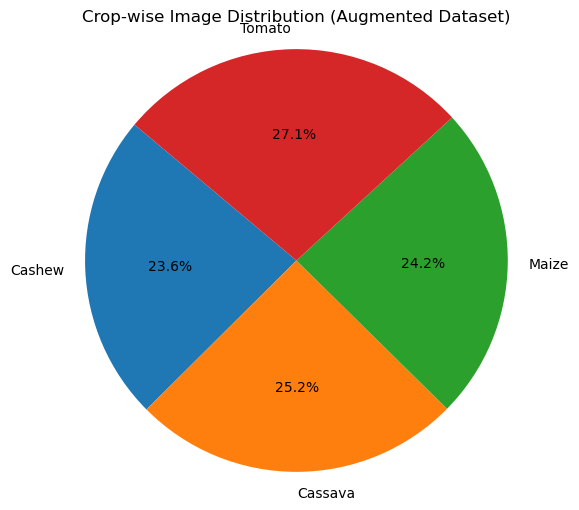

In [15]:
import matplotlib.pyplot as plt

# ---- RAW DATASET ----
raw_crop_image_counts = {
    "Cashew": 1729 + 392 + 1368 + 1378 + 1682,
    "Cassava": 2614 + 1481 + 1015 + 1193 + 1205,
    "Maize": 285 + 673 + 208 + 948 + 1006 + 1259 + 979,
    "Tomato": 470 + 1301 + 518 + 2743 + 773
}

# ---- AUGMENTED DATASET ----
aug_crop_image_counts = {
    "Cashew": 18910,
    "Cassava": 20212,
    "Maize": 19426,
    "Tomato": 21723
}

# ---- Function to Plot Pie Chart ----
def plot_crop_distribution(data, title):
    labels = list(data.keys())
    sizes = list(data.values())
    plt.figure(figsize=(6, 6))
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)
    plt.title(title)
    plt.axis('equal')
    plt.show()

# Plot for Raw
plot_crop_distribution(raw_crop_image_counts, "Crop-wise Image Distribution (Raw Dataset)")

# Plot for Augmented
plot_crop_distribution(aug_crop_image_counts, "Crop-wise Image Distribution (Augmented Dataset)")


In [16]:
from pathlib import Path
from collections import defaultdict
import matplotlib.pyplot as plt
import seaborn as sns

# File extensions to include
valid_exts = [".jpg", ".jpeg", ".png"]

def count_images(directory):
    """Recursively count image files with valid extensions in a directory."""
    return len([
        f for f in directory.rglob("*")
        if f.is_file() and f.suffix.lower() in valid_exts
    ])

# -------------------------------
# RAW DATASET COUNTING
# -------------------------------
raw_base_dir = Path("Dataset for Crop Pest and Disease Detection/Raw Data/CCMT Dataset")
crop_folders_raw = [f for f in raw_base_dir.iterdir() if f.is_dir()]

image_count_raw = defaultdict(int)
class_count_raw = {}

for crop in crop_folders_raw:
    for disease in crop.iterdir():
        if disease.is_dir():
            num_images = count_images(disease)
            image_count_raw[crop.name] += num_images
            class_count_raw[f"{crop.name}/{disease.name}"] = num_images

print(f"✅ Total raw train images: {sum(image_count_raw.values())}")

# -------------------------------
# AUGMENTED DATASET COUNTING
# -------------------------------
aug_base_dir = Path("Dataset for Crop Pest and Disease Detection/CCMT Dataset-Augmented")
crop_folders_aug = [f for f in aug_base_dir.iterdir() if f.is_dir()]

image_count_aug = defaultdict(int)
class_count_aug = {}

for crop in crop_folders_aug:
    train_dir = crop / "train_set"
    if train_dir.exists():
        for disease in train_dir.iterdir():
            if disease.is_dir():
                num_images = count_images(disease)
                image_count_aug[crop.name] += num_images
                class_count_aug[f"{crop.name}/{disease.name}"] = num_images

print(f"✅ Total augmented train images: {sum(image_count_aug.values())}")

# -------------------------------
# COMBINED TOTAL
# -------------------------------
combined_total = sum(image_count_raw.values()) + sum(image_count_aug.values())
print(f"✅ Total combined train images: {combined_total}")


✅ Total raw train images: 25220
✅ Total augmented train images: 80271
✅ Total combined train images: 105491


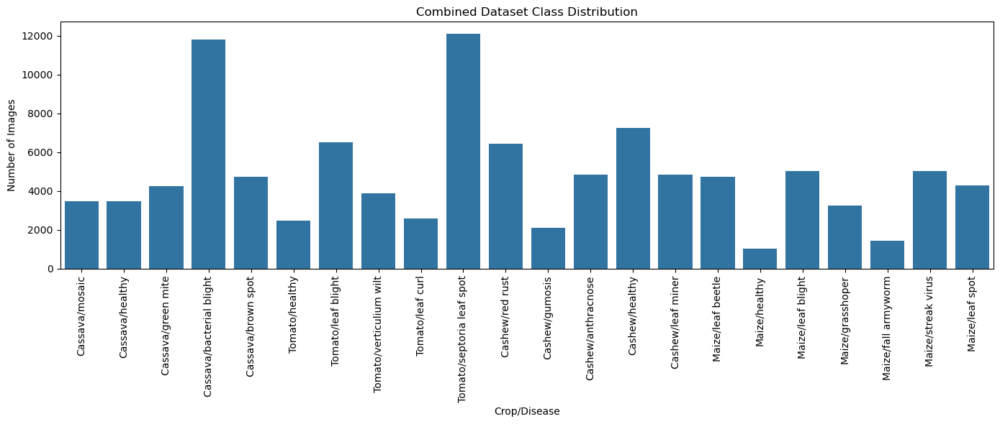

In [17]:
def plot_class_distribution(count_dict, title):
    plt.figure(figsize=(14, 6))
    sns.barplot(x=list(count_dict.keys()), y=list(count_dict.values()))
    plt.xticks(rotation=90)
    plt.title(title)
    plt.ylabel("Number of Images")
    plt.xlabel("Crop/Disease")
    plt.tight_layout()
    plt.show()

from collections import Counter

# Merge class-level counts
combined_class_count = Counter(class_count_raw) + Counter(class_count_aug)

# Now plot the combined distribution
plot_class_distribution(combined_class_count, "Combined Dataset Class Distribution")


In [18]:
print("Combined Class-wise Image Counts:\n")
for cls, count in sorted(combined_class_count.items()):
    print(f"{cls}: {count} images")


Combined Class-wise Image Counts:

Cashew/anthracnose: 4831 images
Cashew/gumosis: 2106 images
Cashew/healthy: 7245 images
Cashew/leaf miner: 4844 images
Cashew/red rust: 6433 images
Cassava/bacterial blight: 11809 images
Cassava/brown spot: 4731 images
Cassava/green mite: 4261 images
Cassava/healthy: 3464 images
Cassava/mosaic: 3455 images
Maize/fall armyworm: 1425 images
Maize/grasshoper: 3248 images
Maize/healthy: 1038 images
Maize/leaf beetle: 4737 images
Maize/leaf blight: 5031 images
Maize/leaf spot: 4283 images
Maize/streak virus: 5022 images
Tomato/healthy: 2470 images
Tomato/leaf blight: 6501 images
Tomato/leaf curl: 2568 images
Tomato/septoria leaf spot: 12116 images
Tomato/verticulium wilt: 3873 images


In [19]:
# import os
# import shutil
# from pathlib import Path

# # Define source paths
# raw_base_dir = Path("Dataset for Crop Pest and Disease Detection/Raw Data/CCMT Dataset")
# aug_base_dir = Path("Dataset for Crop Pest and Disease Detection/CCMT Dataset-Augmented")
# combined_base_dir = Path("combined_train_data")  # Output directory

# # File extensions to copy
# valid_exts = [".jpg", ".jpeg", ".png"]

# # Function to copy images
# def copy_images(src_dir, dest_dir):
#     dest_dir.mkdir(parents=True, exist_ok=True)
#     for img_path in src_dir.rglob("*"):
#         if img_path.is_file() and img_path.suffix.lower() in valid_exts:
#             dest_file = dest_dir / img_path.name
#             if dest_file.exists():
#                 new_name = dest_dir / f"{img_path.stem}_{hash(img_path)}{img_path.suffix.lower()}"
#                 shutil.copy(img_path, new_name)
#             else:
#                 shutil.copy(img_path, dest_file)

# # 1. Copy RAW images
# for crop_dir in raw_base_dir.iterdir():
#     if crop_dir.is_dir():
#         for disease_dir in crop_dir.iterdir():
#             if disease_dir.is_dir():
#                 dest = combined_base_dir / crop_dir.name / disease_dir.name
#                 copy_images(disease_dir, dest)

# # 2. Copy AUGMENTED train_set images
# for crop_dir in aug_base_dir.iterdir():
#     train_dir = crop_dir / "train_set"
#     if train_dir.exists():
#         for disease_dir in train_dir.iterdir():
#             if disease_dir.is_dir():
#                 dest = combined_base_dir / crop_dir.name / disease_dir.name
#                 copy_images(disease_dir, dest)

# print("✅ Combined dataset created at:", combined_base_dir.resolve())


✅ Combined dataset created at: /Users/akorankye/Downloads/combined_train_data


In [20]:
# import os
# import shutil
# from pathlib import Path

# source_dir = Path("combined_train_data")
# dest_dir = Path("combined_train_data_flat")

# valid_exts = [".jpg", ".jpeg", ".png"]

# dest_dir.mkdir(parents=True, exist_ok=True)

# for crop_folder in source_dir.iterdir():
#     if crop_folder.is_dir():
#         for disease_folder in crop_folder.iterdir():
#             if disease_folder.is_dir():
#                 # Create new flattened class folder
#                 new_class_name = f"{crop_folder.name}_{disease_folder.name}"
#                 dest_class_path = dest_dir / new_class_name
#                 dest_class_path.mkdir(exist_ok=True)

#                 # Copy images (case-insensitive + recursive)
#                 for image_file in disease_folder.rglob("*"):
#                     if image_file.is_file() and image_file.suffix.lower() in valid_exts:
#                         dest_path = dest_class_path / image_file.name
#                         if dest_path.exists():
#                             dest_path = dest_class_path / f"{image_file.stem}_{hash(image_file)}{image_file.suffix.lower()}"
#                         shutil.copy(image_file, dest_path)

# print("✅ Dataset has been flattened successfully!")


✅ Dataset has been flattened successfully!


In [21]:
# import shutil
# from pathlib import Path

# # Source and destination paths
# source_dir = Path("Dataset for Crop Pest and Disease Detection/CCMT Dataset-Augmented")  # test folders inside each crop dir
# dest_dir = Path("Dataset for Crop Pest and Disease Detection/CCMT Dataset-Augmented-Test-Flattened")

# # Valid image extensions
# valid_exts = [".jpg", ".jpeg", ".png"]

# # Create the flattened test directory if it doesn't exist
# dest_dir.mkdir(parents=True, exist_ok=True)

# # Loop through each crop (e.g., Cashew, Maize, etc.)
# for crop_dir in source_dir.iterdir():
#     if crop_dir.is_dir():
#         test_dir = crop_dir / "test_set"
#         if test_dir.exists():
#             for disease_dir in test_dir.iterdir():
#                 if disease_dir.is_dir():
#                     flattened_class_name = f"{crop_dir.name}_{disease_dir.name}"
#                     target_class_dir = dest_dir / flattened_class_name
#                     target_class_dir.mkdir(exist_ok=True)

#                     for img_file in disease_dir.rglob("*"):
#                         if img_file.is_file() and img_file.suffix.lower() in valid_exts:
#                             dest_path = target_class_dir / img_file.name
#                             if dest_path.exists():
#                                 dest_path = target_class_dir / f"{img_file.stem}_{hash(img_file)}{img_file.suffix.lower()}"
#                             shutil.copy(img_file, dest_path)

# print("✅ Test data flattened successfully.")


✅ Test data flattened successfully.


In [22]:
# from pathlib import Path
# from PIL import Image, UnidentifiedImageError

# def remove_corrupted_images(directory):
#     corrupted = []
#     directory = Path(directory)
#     print(f"🔍 Scanning directory: {directory.resolve()}")

#     valid_exts = [".jpg", ".jpeg", ".png"]

#     for file in directory.rglob("*"):
#         if file.is_file() and file.suffix.lower() in valid_exts:
#             try:
#                 with Image.open(file) as img:
#                     img.verify()  # Lightweight check
#                 # Optional deeper check: try loading pixel data
#                 with Image.open(file) as img:
#                     img.load()
#             except (IOError, SyntaxError, UnidentifiedImageError, OSError) as e:
#                 corrupted.append(file)

#     if corrupted:
#         print(f"❌ Found {len(corrupted)} corrupted image(s). Deleting them...")
#         for c in corrupted:
#             try:
#                 c.unlink()
#                 print(f"🗑️ Removed: {c}")
#             except Exception as e:
#                 print(f"⚠️ Could not delete {c}: {e}")
#     else:
#         print("✅ No corrupted images found.")

# # Example usage:
# remove_corrupted_images("combined_train_data")
# remove_corrupted_images("combined_train_data_flat")
# remove_corrupted_images("Dataset for Crop Pest and Disease Detection/CCMT Dataset-Augmented")
# remove_corrupted_images("Dataset for Crop Pest and Disease Detection/CCMT Dataset-Augmented-Test-Flattened")

🔍 Scanning directory: /Users/akorankye/Downloads/combined_train_data
❌ Found 94 corrupted image(s). Deleting them...
🗑️ Removed: combined_train_data/Tomato/healthy/healthy76_.jpg
🗑️ Removed: combined_train_data/Tomato/healthy/healthy77_.jpg
🗑️ Removed: combined_train_data/Tomato/healthy/healthy442_.jpg
🗑️ Removed: combined_train_data/Tomato/healthy/healthy443_.jpg
🗑️ Removed: combined_train_data/Tomato/leaf blight/leaf blight471_.jpg
🗑️ Removed: combined_train_data/Tomato/leaf blight/leaf blight386_.jpg
🗑️ Removed: combined_train_data/Tomato/leaf blight/leaf blight997_.jpg
🗑️ Removed: combined_train_data/Tomato/leaf blight/leaf blight8_.jpg
🗑️ Removed: combined_train_data/Tomato/leaf blight/leaf blight558_.jpg
🗑️ Removed: combined_train_data/Tomato/leaf blight/leaf blight470_.jpg
🗑️ Removed: combined_train_data/Tomato/leaf blight/leaf blight72_.jpg
🗑️ Removed: combined_train_data/Tomato/leaf blight/leaf blight998_.jpg
🗑️ Removed: combined_train_data/Tomato/leaf blight/leaf blight1232_.

#### Old One

In [24]:
# import os
# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# from pathlib import Path
# from PIL import Image, UnidentifiedImageError

# import tensorflow as tf
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
# from tensorflow.keras import layers, models, callbacks
# from sklearn.metrics import classification_report, confusion_matrix

# # -----------------------
# # CONFIG
# # -----------------------
# img_size = (224, 224)
# batch_size = 32
# num_epochs = 20

# train_dir = Path("combined_train_data_flat")
# test_dir = Path("Dataset for Crop Pest and Disease Detection/CCMT Dataset-Augmented-Test-Flattened")

# # -----------------------
# # CUSTOM SAFE GENERATOR WRAPPER
# # -----------------------
# from tensorflow.keras.utils import Sequence

# class SafeDirectoryIterator(Sequence):
#     def __init__(self, directory, image_data_generator, subset=None, shuffle=True, seed=42, **kwargs):
#         self.generator = image_data_generator.flow_from_directory(
#             directory,
#             subset=subset,
#             shuffle=shuffle,
#             seed=seed,
#             **kwargs
#         )
#         self.length = len(self.generator)

#     def __len__(self):
#         return self.length

#     def __getitem__(self, index):
#         for _ in range(self.length):
#             try:
#                 return self.generator[index]
#             except (OSError, UnidentifiedImageError) as e:
#                 print(f"⚠️ Skipping corrupted image in batch {index}: {e}")
#                 index = (index + 1) % self.length
#         raise RuntimeError("❌ All batches failed due to corrupted images.")

#     @property
#     def class_indices(self):
#         return self.generator.class_indices

#     @property
#     def num_classes(self):
#         return self.generator.num_classes

#     @property
#     def classes(self):
#         return self.generator.classes

# # -----------------------
# # DATA GENERATORS
# # -----------------------
# train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.1)
# test_datagen = ImageDataGenerator(rescale=1./255)

# train_generator = SafeDirectoryIterator(
#     train_dir,
#     train_datagen,
#     subset='training',
#     target_size=img_size,
#     batch_size=batch_size,
#     class_mode='categorical',
# )

# val_generator = SafeDirectoryIterator(
#     train_dir,
#     train_datagen,
#     subset='validation',
#     target_size=img_size,
#     batch_size=batch_size,
#     class_mode='categorical',
#     shuffle=False
# )

# test_generator = SafeDirectoryIterator(
#     test_dir,
#     test_datagen,
#     target_size=img_size,
#     batch_size=batch_size,
#     class_mode='categorical',
#     shuffle=False
# )

# # -----------------------
# # MODEL ARCHITECTURE
# # -----------------------
# model = models.Sequential([
#     layers.Input(shape=(*img_size, 3)),
#     layers.Conv2D(32, (3, 3), activation='relu'),
#     layers.MaxPooling2D(2, 2),

#     layers.Conv2D(64, (3, 3), activation='relu'),
#     layers.MaxPooling2D(2, 2),

#     layers.Conv2D(128, (3, 3), activation='relu'),
#     layers.MaxPooling2D(2, 2),

#     layers.Flatten(),
#     layers.Dense(256, activation='relu'),
#     layers.Dropout(0.5),
#     layers.Dense(train_generator.num_classes, activation='softmax')
# ])

# model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
# model.summary()

# # -----------------------
# # CALLBACKS
# # -----------------------
# early_stop = callbacks.EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# # -----------------------
# # TRAINING
# # -----------------------
# history = model.fit(
#     train_generator,
#     epochs=num_epochs,
#     validation_data=val_generator,
#     callbacks=[early_stop]
# )

# # -----------------------
# # EVALUATION
# # -----------------------
# loss, accuracy = model.evaluate(test_generator)
# print(f"\n✅ Test Accuracy: {accuracy * 100:.2f}%")

# # -----------------------
# # CLASSIFICATION REPORT
# # -----------------------
# y_pred_probs = model.predict(test_generator)
# y_pred = np.argmax(y_pred_probs, axis=1)
# y_true = test_generator.classes
# class_labels = list(test_generator.class_indices.keys())

# print("\n📊 Classification Report:")
# print(classification_report(y_true, y_pred, target_names=class_labels))

# # -----------------------
# # CONFUSION MATRIX
# # -----------------------
# cm = confusion_matrix(y_true, y_pred)
# plt.figure(figsize=(12, 10))
# sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cmap="Blues")
# plt.title("Confusion Matrix")
# plt.ylabel("Actual")
# plt.xlabel("Predicted")
# plt.xticks(rotation=90)
# plt.tight_layout()
# plt.show()


#### Using Mobile NetV2

In [26]:
# import os
# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# from pathlib import Path
# from PIL import Image, UnidentifiedImageError

# import tensorflow as tf
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
# from tensorflow.keras import layers, models, callbacks
# from tensorflow.keras.applications import MobileNetV2
# from sklearn.metrics import classification_report, confusion_matrix
# from tensorflow.keras.utils import Sequence

# # -----------------------
# # CONFIG
# # -----------------------
# img_size = (224, 224)
# batch_size = 32
# num_epochs = 20
# base_learning_rate = 1e-4

# train_dir = Path("combined_train_data_flat")
# test_dir = Path("Dataset for Crop Pest and Disease Detection/CCMT Dataset-Augmented-Test-Flattened")

# # -----------------------
# # CUSTOM SAFE GENERATOR WRAPPER
# # -----------------------
# class SafeDirectoryIterator(Sequence):
#     def __init__(self, directory, image_data_generator, subset=None, shuffle=True, seed=42, **kwargs):
#         self.generator = image_data_generator.flow_from_directory(
#             directory,
#             subset=subset,
#             shuffle=shuffle,
#             seed=seed,
#             **kwargs
#         )
#         self.length = len(self.generator)

#     def __len__(self):
#         return self.length

#     def __getitem__(self, index):
#         for _ in range(self.length):
#             try:
#                 return self.generator[index]
#             except (OSError, UnidentifiedImageError) as e:
#                 print(f"⚠️ Skipping corrupted image in batch {index}: {e}")
#                 index = (index + 1) % self.length
#         raise RuntimeError("❌ All batches failed due to corrupted images.")

#     @property
#     def class_indices(self):
#         return self.generator.class_indices

#     @property
#     def num_classes(self):
#         return self.generator.num_classes

#     @property
#     def classes(self):
#         return self.generator.classes

# # -----------------------
# # DATA GENERATORS
# # -----------------------
# train_datagen = ImageDataGenerator(
#     rescale=1./255,
#     validation_split=0.1,
#     rotation_range=20,
#     width_shift_range=0.1,
#     height_shift_range=0.1,
#     zoom_range=0.2,
#     horizontal_flip=True,
#     brightness_range=(0.8, 1.2)
# )

# test_datagen = ImageDataGenerator(rescale=1./255)

# train_generator = SafeDirectoryIterator(
#     train_dir,
#     train_datagen,
#     subset='training',
#     target_size=img_size,
#     batch_size=batch_size,
#     class_mode='categorical',
# )

# val_generator = SafeDirectoryIterator(
#     train_dir,
#     train_datagen,
#     subset='validation',
#     target_size=img_size,
#     batch_size=batch_size,
#     class_mode='categorical',
#     shuffle=False
# )

# test_generator = SafeDirectoryIterator(
#     test_dir,
#     test_datagen,
#     target_size=img_size,
#     batch_size=batch_size,
#     class_mode='categorical',
#     shuffle=False
# )

# # -----------------------
# # MODEL ARCHITECTURE (MobileNetV2)
# # -----------------------
# base_model = MobileNetV2(
#     input_shape=(*img_size, 3),
#     include_top=False,
#     weights='imagenet'
# )
# base_model.trainable = False  # freeze for now

# model = models.Sequential([
#     base_model,
#     layers.GlobalAveragePooling2D(),
#     layers.Dense(256, activation='relu'),
#     layers.Dropout(0.5),
#     layers.Dense(train_generator.num_classes, activation='softmax')
# ])

# model.compile(
#     optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
#     loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
#     metrics=['accuracy']
# )

# model.summary()

# # -----------------------
# # CALLBACKS
# # -----------------------
# early_stop = callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# lr_scheduler = callbacks.ReduceLROnPlateau(
#     monitor='val_loss',
#     factor=0.5,
#     patience=2,
#     min_lr=1e-6,
#     verbose=1
# )

# # -----------------------
# # TRAINING
# # -----------------------
# history = model.fit(
#     train_generator,
#     epochs=num_epochs,
#     validation_data=val_generator,
#     callbacks=[early_stop, lr_scheduler]
# )

# # -----------------------
# # OPTIONAL: FINE-TUNING
# # -----------------------
# # Unfreeze base model and re-train with lower LR
# base_model.trainable = True
# for layer in base_model.layers[:-20]:
#     layer.trainable = False

# model.compile(
#     optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
#     loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
#     metrics=['accuracy']
# )

# fine_tune_epochs = 10
# model.fit(
#     train_generator,
#     epochs=fine_tune_epochs,
#     validation_data=val_generator,
#     callbacks=[early_stop, lr_scheduler]
# )

# # -----------------------
# # EVALUATION
# # -----------------------
# loss, accuracy = model.evaluate(test_generator)
# print(f"\n✅ Test Accuracy: {accuracy * 100:.2f}%")

# # -----------------------
# # CLASSIFICATION REPORT
# # -----------------------
# y_pred_probs = model.predict(test_generator)
# y_pred = np.argmax(y_pred_probs, axis=1)
# y_true = test_generator.classes
# class_labels = list(test_generator.class_indices.keys())

# print("\n📊 Classification Report:")
# print(classification_report(y_true, y_pred, target_names=class_labels))

# # -----------------------
# # CONFUSION MATRIX
# # -----------------------
# cm = confusion_matrix(y_true, y_pred)
# plt.figure(figsize=(12, 10))
# sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cmap="Blues")
# plt.title("Confusion Matrix")
# plt.ylabel("Actual")
# plt.xlabel("Predicted")
# plt.xticks(rotation=90)
# plt.tight_layout()
# plt.show()


#### ENHANCED WITH MODEL SAVING CHECKPOINTS (LATEST, MobileNet V2)

Found 94867 images belonging to 22 classes.
Found 10530 images belonging to 22 classes.
Found 24981 images belonging to 22 classes.


2025-07-16 17:18:56.650267: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M4
2025-07-16 17:18:56.650296: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2025-07-16 17:18:56.650299: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
I0000 00:00:1752686336.650631 1193996 pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
I0000 00:00:1752686336.650666 1193996 pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)



🚀 Starting phase 1 (training head only)...


/opt/anaconda3/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20


2025-07-16 17:18:58.185904: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.3311 - loss: 2.7797
Epoch 1: val_accuracy improved from -inf to 0.60342, saving model to best_model.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 457s 153ms/step - accuracy: 0.3311 - loss: 2.7796 - val_accuracy: 0.6034 - val_loss: 1.6530 - learning_rate: 1.0000e-04
Epoch 2/20
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.5525 - loss: 1.9544
Epoch 2: val_accuracy improved from 0.60342 to 0.62972, saving model to best_model.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 451s 152ms/step - accuracy: 0.5525 - loss: 1.9544 - val_accuracy: 0.6297 - val_loss: 1.5695 - learning_rate: 1.0000e-04
Epoch 3/20
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - accuracy: 0.6077 - loss: 1.7117
Epoch 3: val_accuracy improved from 0.62972 to 0.64198, saving model to best_model.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 444s 150ms/step - accuracy: 0.6077 - loss: 1.7117 - val_accuracy: 0.6420 - val_loss: 1.5109 - learning_rate: 1.0000e-04
Epoch 4/20
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - accuracy: 0.6395 - loss: 1.5883
Epoch 4: val_accuracy improved from 0.64198 to 0.65698, saving model to best_model.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 442s 149ms/step - accuracy: 0.6395 - loss: 1.5883 - val_accuracy: 0.6570 - val_loss: 1.4876 - learning_rate: 1.0000e-04
Epoch 5/20
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.6604 - loss: 1.5189
Epoch 5: val_accuracy did not improve from 0.65698
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 446s 150ms/step - accuracy: 0.6604 - loss: 1.5189 - val_accuracy: 0.6507 - val_loss: 1.4788 - learning_rate: 1.0000e-04
Epoch 6/20
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - accuracy: 0.6799 - loss: 1.4688
Epoch 6: val_accuracy improved from 0.65698 to 0.66382, saving model to best_model.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 444s 150ms/step - accuracy: 0.6799 - loss: 1.4688 - val_accuracy: 0.6638 - val_loss: 1.4632 - learning_rate: 1.0000e-04
Epoch 7/20
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.6893 - loss: 1.4460
Epoch 7: val_accuracy improved from 0.66382 to 0.66619, saving model to best_model.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 449s 152ms/step - accuracy: 0.6893 - loss: 1.4460 - val_accuracy: 0.6662 - val_loss: 1.4645 - learning_rate: 1.0000e-04
Epoch 8/20
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - accuracy: 0.6908 - loss: 1.4305
Epoch 8: val_accuracy did not improve from 0.66619
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 444s 150ms/step - accuracy: 0.6908 - loss: 1.4305 - val_accuracy: 0.6641 - val_loss: 1.4506 - learning_rate: 1.0000e-04
Epoch 9/20
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - accuracy: 0.7016 - loss: 1.4151
Epoch 9: val_accuracy did not improve from 0.66619
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 443s 149ms/step - accuracy: 0.7016 - loss: 1.4151 - val_accuracy: 0.6661 - val_loss: 1.4529 - learning_rate: 1.0000e-04
Epoch 10/20
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step - accuracy: 0.7031 - loss: 1.4050
Epoch 10: val_accuracy improved from 0.66619 to 0.66828, saving model to best_model.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 1111s 375ms/step - accuracy: 0.7031 - loss: 1.4050 - val_accuracy: 0.6683 - val_loss: 1.4454 - learning_rate: 1.0000e-04
Epoch 11/20
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.7056 - loss: 1.4013
Epoch 11: val_accuracy improved from 0.66828 to 0.66923, saving model to best_model.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 448s 151ms/step - accuracy: 0.7056 - loss: 1.4013 - val_accuracy: 0.6692 - val_loss: 1.4423 - learning_rate: 1.0000e-04
Epoch 12/20
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - accuracy: 0.7089 - loss: 1.3916
Epoch 12: val_accuracy improved from 0.66923 to 0.67531, saving model to best_model.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 444s 150ms/step - accuracy: 0.7089 - loss: 1.3916 - val_accuracy: 0.6753 - val_loss: 1.4373 - learning_rate: 1.0000e-04
Epoch 13/20
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - accuracy: 0.7115 - loss: 1.3870
Epoch 13: val_accuracy did not improve from 0.67531
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 445s 150ms/step - accuracy: 0.7115 - loss: 1.3870 - val_accuracy: 0.6641 - val_loss: 1.4539 - learning_rate: 1.0000e-04
Epoch 14/20
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7117 - loss: 1.3841
Epoch 14: val_accuracy did not improve from 0.67531
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 6489s 2s/step - accuracy: 0.7117 - loss: 1.3841 - val_accuracy: 0.6710 - val_loss: 1.4343 - learning_rate: 1.0000e-04
Epoch 15/20
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step - accuracy: 0.7111 - loss: 1.3871
Epoch 15: val_accuracy did not improve from 0.67531
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 907s 306ms/step - accuracy: 0.7111 - loss: 1.3871 - val_accuracy: 0.6695 - val_loss: 1.4359 

2965/2965 ━━━━━━━━━━━━━━━━━━━━ 2962s 999ms/step - accuracy: 0.7179 - loss: 1.3721 - val_accuracy: 0.6783 - val_loss: 1.4293 - learning_rate: 5.0000e-05
Epoch 18/20
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - accuracy: 0.7193 - loss: 1.3674
Epoch 18: val_accuracy did not improve from 0.67825
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 444s 150ms/step - accuracy: 0.7193 - loss: 1.3674 - val_accuracy: 0.6732 - val_loss: 1.4332 - learning_rate: 5.0000e-05
Epoch 19/20
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - accuracy: 0.7218 - loss: 1.3650
Epoch 19: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.

Epoch 19: val_accuracy did not improve from 0.67825
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 680s 229ms/step - accuracy: 0.7218 - loss: 1.3650 - val_accuracy: 0.6733 - val_loss: 1.4330 - learning_rate: 5.0000e-05
Epoch 20/20
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.7203 - loss: 1.3674
Epoch 20: val_accuracy did not improve from 0.67825
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 814s 275

2965/2965 ━━━━━━━━━━━━━━━━━━━━ 668s 224ms/step - accuracy: 0.6525 - loss: 1.5492 - val_accuracy: 0.6824 - val_loss: 1.4089 - learning_rate: 1.0000e-05
Epoch 2/10
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step - accuracy: 0.7281 - loss: 1.3591
Epoch 2: val_accuracy improved from 0.68243 to 0.70503, saving model to best_model.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 908s 306ms/step - accuracy: 0.7281 - loss: 1.3591 - val_accuracy: 0.7050 - val_loss: 1.3679 - learning_rate: 1.0000e-05
Epoch 3/10
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.7450 - loss: 1.3160
Epoch 3: val_accuracy improved from 0.70503 to 0.72118, saving model to best_model.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 451s 152ms/step - accuracy: 0.7450 - loss: 1.3160 - val_accuracy: 0.7212 - val_loss: 1.3215 - learning_rate: 1.0000e-05
Epoch 4/10
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 741ms/step - accuracy: 0.7568 - loss: 1.2829
Epoch 4: val_accuracy improved from 0.72118 to 0.72887, saving model to best_model.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 2644s 892ms/step - accuracy: 0.7568 - loss: 1.2829 - val_accuracy: 0.7289 - val_loss: 1.2996 - learning_rate: 1.0000e-05
Epoch 5/10
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 892ms/step - accuracy: 0.7657 - loss: 1.2580
Epoch 5: val_accuracy improved from 0.72887 to 0.73894, saving model to best_model.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 2689s 907ms/step - accuracy: 0.7657 - loss: 1.2580 - val_accuracy: 0.7389 - val_loss: 1.2794 - learning_rate: 1.0000e-05
Epoch 6/10
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 864ms/step - accuracy: 0.7766 - loss: 1.2352
Epoch 6: val_accuracy improved from 0.73894 to 0.73903, saving model to best_model.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 2605s 879ms/step - accuracy: 0.7766 - loss: 1.2352 - val_accuracy: 0.7390 - val_loss: 1.2701 - learning_rate: 1.0000e-05
Epoch 7/10
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step - accuracy: 0.7859 - loss: 1.2122
Epoch 7: val_accuracy improved from 0.73903 to 0.74710, saving model to best_model.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 1097s 370ms/step - accuracy: 0.7859 - loss: 1.2122 - val_accuracy: 0.7471 - val_loss: 1.2546 - learning_rate: 1.0000e-05
Epoch 8/10
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.7886 - loss: 1.2041
Epoch 8: val_accuracy improved from 0.74710 to 0.75233, saving model to best_model.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 450s 152ms/step - accuracy: 0.7886 - loss: 1.2041 - val_accuracy: 0.7523 - val_loss: 1.2424 - learning_rate: 1.0000e-05
Epoch 9/10
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - accuracy: 0.7971 - loss: 1.1884
Epoch 9: val_accuracy improved from 0.75233 to 0.75337, saving model to best_model.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 444s 150ms/step - accuracy: 0.7971 - loss: 1.1884 - val_accuracy: 0.7534 - val_loss: 1.2357 - learning_rate: 1.0000e-05
Epoch 10/10
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.7983 - loss: 1.1787
Epoch 10: val_accuracy improved from 0.75337 to 0.76135, saving model to best_model.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 448s 151ms/step - accuracy: 0.7983 - loss: 1.1787 - val_accuracy: 0.7613 - val_loss: 1.2191 - learning_rate: 1.0000e-05

📦 Loading best model from disk...


781/781 ━━━━━━━━━━━━━━━━━━━━ 72s 91ms/step - accuracy: 0.8573 - loss: 1.0438

✅ Final Test Accuracy: 80.78%
781/781 ━━━━━━━━━━━━━━━━━━━━ 71s 90ms/step

📊 Classification Report:
                           precision    recall  f1-score   support

       Cashew_anthracnose       0.84      0.80      0.82      1838
           Cashew_gumosis       0.98      0.96      0.97       425
           Cashew_healthy       0.80      0.98      0.88      1336
        Cashew_leaf miner       0.87      0.85      0.86      1487
          Cashew_red rust       0.97      0.95      0.96      1815
 Cassava_bacterial blight       0.77      0.91      0.84      2623
       Cassava_brown spot       0.91      0.73      0.81      1483
       Cassava_green mite       0.82      0.84      0.83      1020
          Cassava_healthy       0.93      0.92      0.93      1184
           Cassava_mosaic       0.96      0.78      0.86      1200
      Maize_fall armyworm       0.81      0.74      0.77       284
         Maize_gra

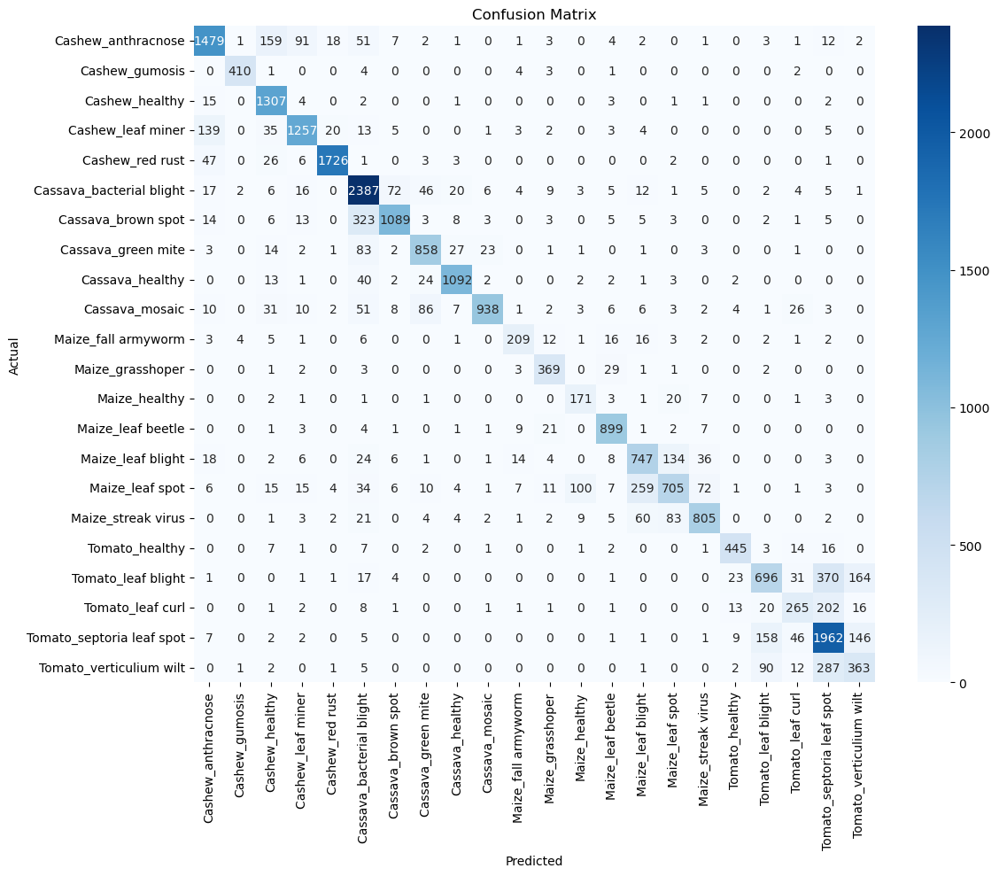

In [28]:
# ## ENHANCED WITH MODEL SAVING CHECKPOINTS (LATEST)

# import os
# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# from pathlib import Path
# from PIL import Image, UnidentifiedImageError

# import tensorflow as tf
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
# from tensorflow.keras import layers, models, callbacks
# from tensorflow.keras.applications import MobileNetV2
# from sklearn.metrics import classification_report, confusion_matrix
# from tensorflow.keras.utils import Sequence
# from tensorflow.keras.models import load_model

# # -----------------------
# # CONFIG
# # -----------------------
# img_size = (224, 224)
# batch_size = 32
# num_epochs = 20
# fine_tune_epochs = 10
# initial_learning_rate = 1e-4
# fine_tune_learning_rate = 1e-5

# train_dir = Path("combined_train_data_flat")
# test_dir = Path("Dataset for Crop Pest and Disease Detection/CCMT Dataset-Augmented-Test-Flattened")

# # -----------------------
# # CUSTOM SAFE GENERATOR WRAPPER
# # -----------------------
# class SafeDirectoryIterator(Sequence):
#     def __init__(self, directory, image_data_generator, subset=None, shuffle=True, seed=42, **kwargs):
#         self.generator = image_data_generator.flow_from_directory(
#             directory,
#             subset=subset,
#             shuffle=shuffle,
#             seed=seed,
#             **kwargs
#         )
#         self.length = len(self.generator)

#     def __len__(self):
#         return self.length

#     def __getitem__(self, index):
#         for _ in range(self.length):
#             try:
#                 return self.generator[index]
#             except (OSError, UnidentifiedImageError) as e:
#                 print(f"⚠️ Skipping corrupted image in batch {index}: {e}")
#                 index = (index + 1) % self.length
#         raise RuntimeError("❌ All batches failed due to corrupted images.")

#     @property
#     def class_indices(self):
#         return self.generator.class_indices

#     @property
#     def num_classes(self):
#         return self.generator.num_classes

#     @property
#     def classes(self):
#         return self.generator.classes

# # -----------------------
# # DATA GENERATORS
# # -----------------------
# train_datagen = ImageDataGenerator(
#     rescale=1./255,
#     validation_split=0.1,
#     rotation_range=20,
#     width_shift_range=0.1,
#     height_shift_range=0.1,
#     zoom_range=0.2,
#     horizontal_flip=True,
#     brightness_range=(0.8, 1.2)
# )

# test_datagen = ImageDataGenerator(rescale=1./255)

# train_generator = SafeDirectoryIterator(
#     train_dir,
#     train_datagen,
#     subset='training',
#     target_size=img_size,
#     batch_size=batch_size,
#     class_mode='categorical',
# )

# val_generator = SafeDirectoryIterator(
#     train_dir,
#     train_datagen,
#     subset='validation',
#     target_size=img_size,
#     batch_size=batch_size,
#     class_mode='categorical',
#     shuffle=False
# )

# test_generator = SafeDirectoryIterator(
#     test_dir,
#     test_datagen,
#     target_size=img_size,
#     batch_size=batch_size,
#     class_mode='categorical',
#     shuffle=False
# )

# # -----------------------
# # MODEL SETUP (MobileNetV2 base)
# # -----------------------
# base_model = MobileNetV2(
#     input_shape=(*img_size, 3),
#     include_top=False,
#     weights='imagenet'
# )
# base_model.trainable = False  # freeze for now

# model = models.Sequential([
#     base_model,
#     layers.GlobalAveragePooling2D(),
#     layers.Dense(256, activation='relu'),
#     layers.Dropout(0.5),
#     layers.Dense(train_generator.num_classes, activation='softmax')
# ])

# # -----------------------
# # CALLBACKS
# # -----------------------
# early_stop = callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# lr_scheduler = callbacks.ReduceLROnPlateau(
#     monitor='val_loss',
#     factor=0.5,
#     patience=2,
#     min_lr=1e-6,
#     verbose=1
# )

# checkpoint_cb = callbacks.ModelCheckpoint(
#     "best_model.h5",
#     monitor='val_accuracy',
#     mode='max',
#     save_best_only=True,
#     verbose=1
# )

# # -----------------------
# # PHASE 1: Train head only
# # -----------------------
# model.compile(
#     optimizer=tf.keras.optimizers.Adam(learning_rate=initial_learning_rate),
#     loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
#     metrics=['accuracy']
# )

# print("\n🚀 Starting phase 1 (training head only)...")
# model.fit(
#     train_generator,
#     epochs=num_epochs,
#     validation_data=val_generator,
#     callbacks=[early_stop, lr_scheduler, checkpoint_cb]
# )

# # -----------------------
# # PHASE 2: Fine-tune top of MobileNetV2
# # -----------------------
# print("\n🔧 Starting phase 2 (fine-tuning)...")

# base_model.trainable = True
# for layer in base_model.layers[:-20]:
#     layer.trainable = False

# model.compile(
#     optimizer=tf.keras.optimizers.Adam(learning_rate=fine_tune_learning_rate),
#     loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
#     metrics=['accuracy']
# )

# model.fit(
#     train_generator,
#     epochs=fine_tune_epochs,
#     validation_data=val_generator,
#     callbacks=[early_stop, lr_scheduler, checkpoint_cb]
# )

# # -----------------------
# # LOAD BEST MODEL
# # -----------------------
# print("\n📦 Loading best model from disk...")
# best_model = load_model("best_model.h5")

# # -----------------------
# # EVALUATION
# # -----------------------
# loss, accuracy = best_model.evaluate(test_generator)
# print(f"\n✅ Final Test Accuracy: {accuracy * 100:.2f}%")

# # -----------------------
# # CLASSIFICATION REPORT
# # -----------------------
# y_pred_probs = best_model.predict(test_generator)
# y_pred = np.argmax(y_pred_probs, axis=1)
# y_true = test_generator.classes
# class_labels = list(test_generator.class_indices.keys())

# print("\n📊 Classification Report:")
# print(classification_report(y_true, y_pred, target_names=class_labels))

# # -----------------------
# # CONFUSION MATRIX
# # -----------------------
# cm = confusion_matrix(y_true, y_pred)
# plt.figure(figsize=(12, 10))
# sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cmap="Blues")
# plt.title("Confusion Matrix")
# plt.ylabel("Actual")
# plt.xlabel("Predicted")
# plt.xticks(rotation=90)
# plt.tight_layout()
# plt.show()



🌾 Per-Crop Classification Metrics:
                         Crop  Precision  Recall  F1-Score
0          Cashew_anthracnose     0.8408  0.8047    0.8224
1              Cashew_gumosis     0.9809  0.9647    0.9727
2              Cashew_healthy     0.7984  0.9783    0.8792
3           Cashew_leaf miner     0.8747  0.8453    0.8598
4             Cashew_red rust     0.9724  0.9510    0.9616
5    Cassava_bacterial blight     0.7725  0.9100    0.8356
6          Cassava_brown spot     0.9052  0.7343    0.8109
7          Cassava_green mite     0.8250  0.8412    0.8330
8             Cassava_healthy     0.9341  0.9223    0.9282
9              Cassava_mosaic     0.9571  0.7817    0.8606
10        Maize_fall armyworm     0.8132  0.7359    0.7726
11           Maize_grasshoper     0.8330  0.8978    0.8642
12              Maize_healthy     0.5876  0.8104    0.6813
13          Maize_leaf beetle     0.8981  0.9463    0.9216
14          Maize_leaf blight     0.6682  0.7440    0.7041
15            Maize_

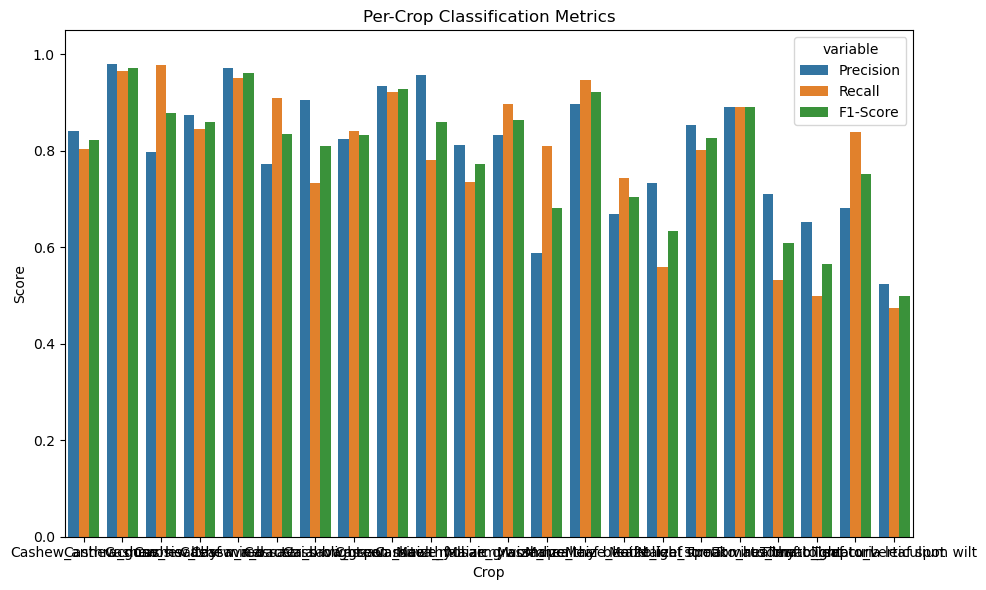

In [29]:
from sklearn.metrics import precision_recall_fscore_support
from collections import defaultdict
import pandas as pd

# 1. Get full per-class metrics
precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, zero_division=0)

# 2. Group metrics by crop
per_crop_metrics = defaultdict(lambda: {'precision': [], 'recall': [], 'f1': []})

for i, class_label in enumerate(class_labels):
    crop = class_label.split('/')[0]  # e.g., 'Cashew' from 'Cashew/anthracnose'
    per_crop_metrics[crop]['precision'].append(precision[i])
    per_crop_metrics[crop]['recall'].append(recall[i])
    per_crop_metrics[crop]['f1'].append(f1[i])

# 3. Aggregate (mean) per crop
crop_results = []
for crop, metrics in per_crop_metrics.items():
    crop_precision = np.mean(metrics['precision'])
    crop_recall = np.mean(metrics['recall'])
    crop_f1 = np.mean(metrics['f1'])
    crop_results.append({
        'Crop': crop,
        'Precision': round(crop_precision, 4),
        'Recall': round(crop_recall, 4),
        'F1-Score': round(crop_f1, 4)
    })

# 4. Display as DataFrame
crop_df = pd.DataFrame(crop_results)
print("\n🌾 Per-Crop Classification Metrics:")
print(crop_df)

# Optional: visualize
plt.figure(figsize=(10, 6))
sns.barplot(data=crop_df.melt(id_vars='Crop'), x='Crop', y='value', hue='variable')
plt.title("Per-Crop Classification Metrics")
plt.ylabel("Score")
plt.ylim(0, 1.05)
plt.tight_layout()
plt.show()

In [30]:
model.save("crop_disease_classifier.h5")

In [31]:
print("hi")

hi


In [32]:
from datetime import datetime

timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
model.save(f"crop_disease_classifier_{timestamp}.h5")

In [33]:
# import numpy as np
# from tensorflow.keras.models import load_model
# from tensorflow.keras.preprocessing import image
# import matplotlib.pyplot as plt

# # -----------------------
# # CONFIG
# # -----------------------
# model_path = "crop_disease_classifier.h5"  # or your actual saved model file
# img_path = "Dataset for Crop Pest and Disease Detection/CCMT Dataset-Augmented-Test-Flattened/Cashew_red rust/0cashew_valid_red rust.JPG"  # replace with your image path
# img_size = (224, 224)  # should match the size used during training

# # -----------------------
# # LOAD MODEL AND CLASS LABELS
# # -----------------------
# model = load_model(model_path)

# # Assuming you have class_indices from training
# # Save this dictionary during training and reuse it here
# class_indices = val_generator.class_indices  # or test_generator.class_indices
# idx_to_class = {v: k for k, v in class_indices.items()}  # reverse mapping

# # -----------------------
# # LOAD AND PREPROCESS IMAGE
# # -----------------------
# img = image.load_img(img_path, target_size=img_size)
# img_array = image.img_to_array(img)
# img_array = img_array / 255.0  # same rescale as training
# img_array = np.expand_dims(img_array, axis=0)  # shape: (1, 224, 224, 3)

# # -----------------------
# # PREDICT
# # -----------------------
# pred_probs = model.predict(img_array)
# pred_class_index = np.argmax(pred_probs)
# pred_class_label = idx_to_class[pred_class_index]
# confidence = pred_probs[0][pred_class_index]

# # -----------------------
# # DISPLAY RESULT
# # -----------------------
# plt.imshow(img)
# plt.axis("off")
# plt.title(f"Predicted: {pred_class_label} ({confidence * 100:.2f}%)")
# plt.show()


#### Fine tuning again

In [3]:
from tensorflow.keras.models import load_model

model = load_model("crop_disease_classifier_20250717_021422.h5")

2025-07-17 09:27:02.030118: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M4
2025-07-17 09:27:02.030148: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2025-07-17 09:27:02.030151: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
I0000 00:00:1752744422.030350   16105 pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
I0000 00:00:1752744422.030545   16105 pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [4]:
import numpy as np
from pathlib import Path
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model
from tensorflow.keras import callbacks, optimizers, losses

# -----------------------
# CONFIG
# -----------------------
img_size = (224, 224)
batch_size = 32
fine_tune_epochs = 100
fine_tune_learning_rate = 1e-5

train_dir = Path("combined_train_data_flat")
test_dir = Path("Dataset for Crop Pest and Disease Detection/CCMT Dataset-Augmented-Test-Flattened")

# -----------------------
# LOAD SAVED MODEL
# -----------------------
model = load_model("crop_disease_classifier_20250717_021422.h5")

# -----------------------
# REBUILD DATA GENERATORS
# (Must match what you used during original training)
# -----------------------
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.1,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=(0.8, 1.2)
)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    subset='training',
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True,
    seed=42
)

val_generator = train_datagen.flow_from_directory(
    train_dir,
    subset='validation',
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False,
    seed=42
)

# -----------------------
# (OPTIONAL) UNFREEZE MORE BASE MODEL LAYERS
# -----------------------
base_model = model.layers[0]  # MobileNetV2 is the first layer in Sequential
base_model.trainable = True
for layer in base_model.layers[:-40]:  # Freeze all except last 40 layers
    layer.trainable = False

# -----------------------
# RE-COMPILE THE MODEL
# -----------------------
model.compile(
    optimizer=optimizers.Adam(learning_rate=fine_tune_learning_rate),
    loss=losses.CategoricalCrossentropy(label_smoothing=0.1),
    metrics=['accuracy']
)

# -----------------------
# CALLBACKS (MATCHING YOUR ORIGINAL ONES)
# -----------------------
early_stop = callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

lr_scheduler = callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=2,
    min_lr=1e-6,
    verbose=1
)

checkpoint_cb = callbacks.ModelCheckpoint(
    "crop_disease_classifier_finetuned.h5",
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)

# -----------------------
# CONTINUE TRAINING
# -----------------------
print("\n🔁 Resuming training...")
model.fit(
    train_generator,
    epochs=fine_tune_epochs,
    validation_data=val_generator,
    callbacks=[early_stop, lr_scheduler, checkpoint_cb]
)


Found 94867 images belonging to 22 classes.
Found 10530 images belonging to 22 classes.

🔁 Resuming training...


/opt/anaconda3/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100


2025-07-17 09:27:05.967483: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.
E0000 00:00:1752744425.972868   16105 meta_optimizer.cc:967] PluggableGraphOptimizer failed: INVALID_ARGUMENT: Failed to deserialize the `graph_buf`.


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - accuracy: 0.7920 - loss: 1.2168

E0000 00:00:1752744851.146446   16105 meta_optimizer.cc:967] PluggableGraphOptimizer failed: INVALID_ARGUMENT: Failed to deserialize the `graph_buf`.



Epoch 1: val_accuracy improved from -inf to 0.76733, saving model to crop_disease_classifier_finetuned.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 472s 158ms/step - accuracy: 0.7920 - loss: 1.2168 - val_accuracy: 0.7673 - val_loss: 1.1676 - learning_rate: 1.0000e-05
Epoch 2/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.8016 - loss: 1.1432
Epoch 2: val_accuracy did not improve from 0.76733
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 449s 151ms/step - accuracy: 0.8016 - loss: 1.1432 - val_accuracy: 0.7653 - val_loss: 1.1642 - learning_rate: 1.0000e-05
Epoch 3/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.8102 - loss: 1.1233
Epoch 3: val_accuracy improved from 0.76733 to 0.77303, saving model to crop_disease_classifier_finetuned.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 447s 151ms/step - accuracy: 0.8102 - loss: 1.1233 - val_accuracy: 0.7730 - val_loss: 1.1549 - learning_rate: 1.0000e-05
Epoch 4/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.8170 - loss: 1.1107
Epoch 4: val_accuracy improved from 0.77303 to 0.77407, saving model to crop_disease_classifier_finetuned.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 452s 152ms/step - accuracy: 0.8170 - loss: 1.1107 - val_accuracy: 0.7741 - val_loss: 1.1457 - learning_rate: 1.0000e-05
Epoch 5/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - accuracy: 0.8214 - loss: 1.0986
Epoch 5: val_accuracy did not improve from 0.77407
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 456s 154ms/step - accuracy: 0.8214 - loss: 1.0986 - val_accuracy: 0.7738 - val_loss: 1.1544 - learning_rate: 1.0000e-05
Epoch 6/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - accuracy: 0.8269 - loss: 1.0847
Epoch 6: val_accuracy improved from 0.77407 to 0.78053, saving model to crop_disease_classifier_finetuned.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 516s 174ms/step - accuracy: 0.8269 - loss: 1.0847 - val_accuracy: 0.7805 - val_loss: 1.1369 - learning_rate: 1.0000e-05
Epoch 7/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - accuracy: 0.8282 - loss: 1.0761
Epoch 7: val_accuracy improved from 0.78053 to 0.78452, saving model to crop_disease_classifier_finetuned.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 569s 192ms/step - accuracy: 0.8282 - loss: 1.0761 - val_accuracy: 0.7845 - val_loss: 1.1372 - learning_rate: 1.0000e-05
Epoch 8/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - accuracy: 0.8326 - loss: 1.0696
Epoch 8: val_accuracy did not improve from 0.78452
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 481s 162ms/step - accuracy: 0.8326 - loss: 1.0696 - val_accuracy: 0.7815 - val_loss: 1.1310 - learning_rate: 1.0000e-05
Epoch 9/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - accuracy: 0.8338 - loss: 1.0632
Epoch 9: val_accuracy improved from 0.78452 to 0.78519, saving model to crop_disease_classifier_finetuned.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 487s 164ms/step - accuracy: 0.8338 - loss: 1.0632 - val_accuracy: 0.7852 - val_loss: 1.1274 - learning_rate: 1.0000e-05
Epoch 10/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - accuracy: 0.8373 - loss: 1.0557
Epoch 10: val_accuracy improved from 0.78519 to 0.78727, saving model to crop_disease_classifier_finetuned.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 465s 157ms/step - accuracy: 0.8373 - loss: 1.0557 - val_accuracy: 0.7873 - val_loss: 1.1211 - learning_rate: 1.0000e-05
Epoch 11/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - accuracy: 0.8437 - loss: 1.0471
Epoch 11: val_accuracy improved from 0.78727 to 0.78822, saving model to crop_disease_classifier_finetuned.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 459s 155ms/step - accuracy: 0.8437 - loss: 1.0471 - val_accuracy: 0.7882 - val_loss: 1.1181 - learning_rate: 1.0000e-05
Epoch 12/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.8448 - loss: 1.0458
Epoch 12: val_accuracy did not improve from 0.78822
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 452s 153ms/step - accuracy: 0.8448 - loss: 1.0458 - val_accuracy: 0.7865 - val_loss: 1.1237 - learning_rate: 1.0000e-05
Epoch 13/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - accuracy: 0.8486 - loss: 1.0313
Epoch 13: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-06.

Epoch 13: val_accuracy did not improve from 0.78822
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 465s 157ms/step - accuracy: 0.8486 - loss: 1.0313 - val_accuracy: 0.7861 - val_loss: 1.1191 - learning_rate: 1.0000e-05
Epoch 14/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - accuracy: 0.8517 - loss: 1.0256
Epoch 14: val_accuracy improved from 0.78822 to 0.79012, saving model to crop_disease_cla

2965/2965 ━━━━━━━━━━━━━━━━━━━━ 467s 157ms/step - accuracy: 0.8517 - loss: 1.0256 - val_accuracy: 0.7901 - val_loss: 1.1146 - learning_rate: 5.0000e-06
Epoch 15/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - accuracy: 0.8511 - loss: 1.0243
Epoch 15: val_accuracy improved from 0.79012 to 0.79193, saving model to crop_disease_classifier_finetuned.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 474s 160ms/step - accuracy: 0.8511 - loss: 1.0243 - val_accuracy: 0.7919 - val_loss: 1.1065 - learning_rate: 5.0000e-06
Epoch 16/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - accuracy: 0.8546 - loss: 1.0183
Epoch 16: val_accuracy did not improve from 0.79193
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 475s 160ms/step - accuracy: 0.8546 - loss: 1.0183 - val_accuracy: 0.7896 - val_loss: 1.1152 - learning_rate: 5.0000e-06
Epoch 17/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - accuracy: 0.8554 - loss: 1.0165
Epoch 17: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-06.

Epoch 17: val_accuracy improved from 0.79193 to 0.79240, saving model to crop_disease_classifier_finetuned.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 471s 159ms/step - accuracy: 0.8554 - loss: 1.0165 - val_accuracy: 0.7924 - val_loss: 1.1081 - learning_rate: 5.0000e-06
Epoch 18/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - accuracy: 0.8557 - loss: 1.0168
Epoch 18: val_accuracy did not improve from 0.79240
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 464s 156ms/step - accuracy: 0.8557 - loss: 1.0168 - val_accuracy: 0.7914 - val_loss: 1.1060 - learning_rate: 2.5000e-06
Epoch 19/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - accuracy: 0.8581 - loss: 1.0097
Epoch 19: val_accuracy did not improve from 0.79240
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 465s 157ms/step - accuracy: 0.8581 - loss: 1.0097 - val_accuracy: 0.7892 - val_loss: 1.1110 - learning_rate: 2.5000e-06
Epoch 20/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - accuracy: 0.8605 - loss: 1.0054
Epoch 20: val_accuracy improved from 0.79240 to 0.79402, saving model to crop_disease_classifier_finetuned.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 459s 155ms/step - accuracy: 0.8605 - loss: 1.0054 - val_accuracy: 0.7940 - val_loss: 1.1055 - learning_rate: 2.5000e-06
Epoch 21/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - accuracy: 0.8604 - loss: 1.0044
Epoch 21: val_accuracy did not improve from 0.79402
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 471s 159ms/step - accuracy: 0.8604 - loss: 1.0044 - val_accuracy: 0.7920 - val_loss: 1.1068 - learning_rate: 2.5000e-06
Epoch 22/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - accuracy: 0.8593 - loss: 1.0058
Epoch 22: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-06.

Epoch 22: val_accuracy did not improve from 0.79402
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 471s 159ms/step - accuracy: 0.8593 - loss: 1.0058 - val_accuracy: 0.7908 - val_loss: 1.1082 - learning_rate: 2.5000e-06
Epoch 23/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - accuracy: 0.8620 - loss: 1.0025
Epoch 23: val_accuracy did not improve from 0.79402
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 460s 1

2965/2965 ━━━━━━━━━━━━━━━━━━━━ 467s 157ms/step - accuracy: 0.8604 - loss: 1.0046 - val_accuracy: 0.7945 - val_loss: 1.1023 - learning_rate: 1.2500e-06
Epoch 25/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - accuracy: 0.8631 - loss: 1.0019
Epoch 25: val_accuracy improved from 0.79449 to 0.79563, saving model to crop_disease_classifier_finetuned.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 471s 159ms/step - accuracy: 0.8631 - loss: 1.0019 - val_accuracy: 0.7956 - val_loss: 1.0970 - learning_rate: 1.2500e-06
Epoch 26/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - accuracy: 0.8626 - loss: 1.0021
Epoch 26: val_accuracy improved from 0.79563 to 0.79829, saving model to crop_disease_classifier_finetuned.h5


2965/2965 ━━━━━━━━━━━━━━━━━━━━ 468s 158ms/step - accuracy: 0.8626 - loss: 1.0021 - val_accuracy: 0.7983 - val_loss: 1.0959 - learning_rate: 1.2500e-06
Epoch 27/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - accuracy: 0.8636 - loss: 0.9990
Epoch 27: val_accuracy did not improve from 0.79829
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 471s 159ms/step - accuracy: 0.8636 - loss: 0.9990 - val_accuracy: 0.7928 - val_loss: 1.1079 - learning_rate: 1.2500e-06
Epoch 28/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - accuracy: 0.8619 - loss: 1.0009
Epoch 28: ReduceLROnPlateau reducing learning rate to 1e-06.

Epoch 28: val_accuracy did not improve from 0.79829
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 461s 155ms/step - accuracy: 0.8619 - loss: 1.0009 - val_accuracy: 0.7980 - val_loss: 1.0980 - learning_rate: 1.2500e-06
Epoch 29/100
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - accuracy: 0.8584 - loss: 1.0031
Epoch 29: val_accuracy did not improve from 0.79829
2965/2965 ━━━━━━━━━━━━━━━━━━━━ 470s 159ms/step - accu

In [6]:
from datetime import datetime

timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
model.save(f"crop_disease_classifier_{timestamp}.h5")

#### LOAD SAVED MODEL AND TEST

Found 24981 images belonging to 22 classes.


/opt/anaconda3/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


781/781 ━━━━━━━━━━━━━━━━━━━━ 72s 91ms/step - accuracy: 0.8883 - loss: 0.9285

✅ Final Test Accuracy: 85.86%


E0000 00:00:1752762898.590202   16105 meta_optimizer.cc:967] PluggableGraphOptimizer failed: INVALID_ARGUMENT: Failed to deserialize the `graph_buf`.


780/781 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step

E0000 00:00:1752762969.662433   16105 meta_optimizer.cc:967] PluggableGraphOptimizer failed: INVALID_ARGUMENT: Failed to deserialize the `graph_buf`.


781/781 ━━━━━━━━━━━━━━━━━━━━ 72s 91ms/step

📊 Classification Report:
                           precision    recall  f1-score   support

       Cashew_anthracnose       0.90      0.83      0.86      1838
           Cashew_gumosis       0.98      0.98      0.98       425
           Cashew_healthy       0.83      0.99      0.90      1336
        Cashew_leaf miner       0.93      0.88      0.90      1487
          Cashew_red rust       0.98      0.97      0.98      1815
 Cassava_bacterial blight       0.83      0.94      0.88      2623
       Cassava_brown spot       0.94      0.80      0.87      1483
       Cassava_green mite       0.86      0.88      0.87      1020
          Cassava_healthy       0.96      0.93      0.95      1184
           Cassava_mosaic       0.96      0.84      0.90      1200
      Maize_fall armyworm       0.89      0.81      0.85       284
         Maize_grasshoper       0.86      0.93      0.89       411
            Maize_healthy       0.65      0.83      0.73   

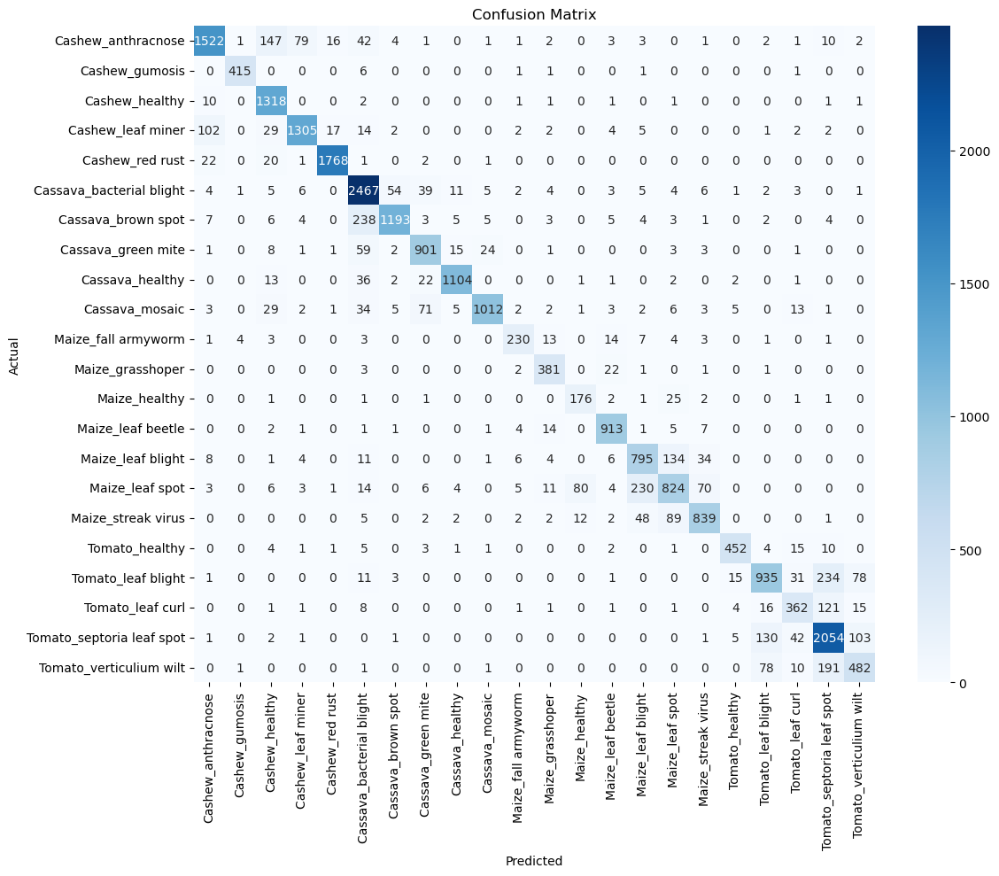

In [29]:
from tensorflow.keras.utils import Sequence
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt

class SafeDirectoryIterator(Sequence):
    def __init__(self, directory, image_data_generator, subset=None, shuffle=True, seed=42, **kwargs):
        self.generator = image_data_generator.flow_from_directory(
            directory,
            subset=subset,
            shuffle=shuffle,
            seed=seed,
            **kwargs
        )
        self.length = len(self.generator)

    def __len__(self):
        return self.length

    def __getitem__(self, index):
        for _ in range(self.length):
            try:
                return self.generator[index]
            except (OSError, UnidentifiedImageError) as e:
                print(f"⚠️ Skipping corrupted image in batch {index}: {e}")
                index = (index + 1) % self.length
        raise RuntimeError("❌ All batches failed due to corrupted images.")

    @property
    def class_indices(self):
        return self.generator.class_indices

    @property
    def num_classes(self):
        return self.generator.num_classes

    @property
    def classes(self):
        return self.generator.classes

test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = SafeDirectoryIterator(
    test_dir,
    test_datagen,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# -----------------------
# EVALUATION
# -----------------------

best_model = load_model("crop_disease_classifier_finetuned.h5")
loss, accuracy = best_model.evaluate(test_generator)
print(f"\n✅ Final Test Accuracy: {accuracy * 100:.2f}%")

# -----------------------
# CLASSIFICATION REPORT
# -----------------------
y_pred_probs = best_model.predict(test_generator)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

print("\n📊 Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_labels))

# -----------------------
# CONFUSION MATRIX
# -----------------------
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cmap="Blues")
plt.title("Confusion Matrix")
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


🌾 Per-Crop Classification Metrics:
                         Crop  Precision  Recall  F1-Score
0          Cashew_anthracnose     0.9033  0.8281    0.8640
1              Cashew_gumosis     0.9834  0.9765    0.9799
2              Cashew_healthy     0.8263  0.9865    0.8994
3           Cashew_leaf miner     0.9262  0.8776    0.9012
4             Cashew_red rust     0.9795  0.9741    0.9768
5    Cassava_bacterial blight     0.8329  0.9405    0.8834
6          Cassava_brown spot     0.9416  0.8045    0.8676
7          Cassava_green mite     0.8573  0.8833    0.8701
8             Cassava_healthy     0.9625  0.9324    0.9472
9              Cassava_mosaic     0.9620  0.8433    0.8988
10        Maize_fall armyworm     0.8880  0.8099    0.8471
11           Maize_grasshoper     0.8620  0.9270    0.8933
12              Maize_healthy     0.6519  0.8341    0.7318
13          Maize_leaf beetle     0.9250  0.9611    0.9427
14          Maize_leaf blight     0.7208  0.7918    0.7546
15            Maize_

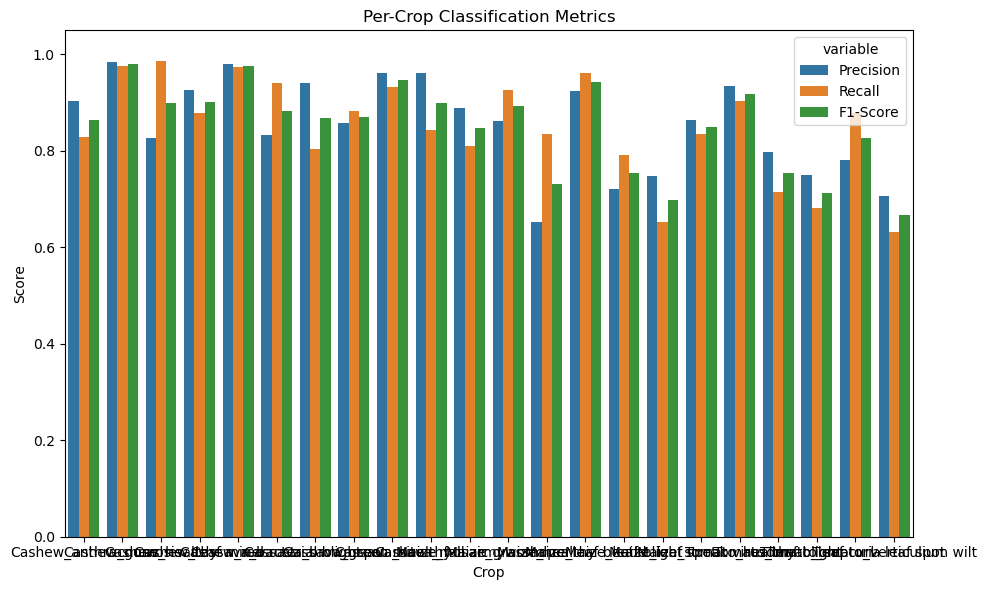

In [30]:
from sklearn.metrics import precision_recall_fscore_support
from collections import defaultdict
import pandas as pd

# 1. Get full per-class metrics
precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, zero_division=0)

# 2. Group metrics by crop
per_crop_metrics = defaultdict(lambda: {'precision': [], 'recall': [], 'f1': []})

for i, class_label in enumerate(class_labels):
    crop = class_label.split('/')[0]  # e.g., 'Cashew' from 'Cashew/anthracnose'
    per_crop_metrics[crop]['precision'].append(precision[i])
    per_crop_metrics[crop]['recall'].append(recall[i])
    per_crop_metrics[crop]['f1'].append(f1[i])

# 3. Aggregate (mean) per crop
crop_results = []
for crop, metrics in per_crop_metrics.items():
    crop_precision = np.mean(metrics['precision'])
    crop_recall = np.mean(metrics['recall'])
    crop_f1 = np.mean(metrics['f1'])
    crop_results.append({
        'Crop': crop,
        'Precision': round(crop_precision, 4),
        'Recall': round(crop_recall, 4),
        'F1-Score': round(crop_f1, 4)
    })

# 4. Display as DataFrame
crop_df = pd.DataFrame(crop_results)
print("\n🌾 Per-Crop Classification Metrics:")
print(crop_df)

# Optional: visualize
plt.figure(figsize=(10, 6))
sns.barplot(data=crop_df.melt(id_vars='Crop'), x='Crop', y='value', hue='variable')
plt.title("Per-Crop Classification Metrics")
plt.ylabel("Score")
plt.ylim(0, 1.05)
plt.tight_layout()
plt.show()

### Single test

In [19]:
from tensorflow.keras.utils import Sequence
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np

test_dir = Path("Dataset for Crop Pest and Disease Detection/CCMT Dataset-Augmented-Test-Flattened")
img_size = (224, 224)
batch_size = 32

class SafeDirectoryIterator(Sequence):
    def __init__(self, directory, image_data_generator, subset=None, shuffle=True, seed=42, **kwargs):
        self.generator = image_data_generator.flow_from_directory(
            directory,
            subset=subset,
            shuffle=shuffle,
            seed=seed,
            **kwargs
        )
        self.length = len(self.generator)

    def __len__(self):
        return self.length

    def __getitem__(self, index):
        for _ in range(self.length):
            try:
                return self.generator[index]
            except (OSError, UnidentifiedImageError) as e:
                print(f"⚠️ Skipping corrupted image in batch {index}: {e}")
                index = (index + 1) % self.length
        raise RuntimeError("❌ All batches failed due to corrupted images.")

    @property
    def class_indices(self):
        return self.generator.class_indices

    @property
    def num_classes(self):
        return self.generator.num_classes

    @property
    def classes(self):
        return self.generator.classes

test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = SafeDirectoryIterator(
    test_dir,
    test_datagen,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# -----------------------
# EVALUATION
# -----------------------



best_model = load_model("crop_disease_classifier_finetuned.h5")
loss, accuracy = best_model.evaluate(test_generator)
print(f"\n✅ Final Test Accuracy: {accuracy * 100:.2f}%")

# -----------------------
# CLASSIFICATION REPORT
# -----------------------
y_pred_probs = best_model.predict([test_generator[0]])
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())


Found 24981 images belonging to 22 classes.


E0000 00:00:1752909030.829659   12592 meta_optimizer.cc:967] PluggableGraphOptimizer failed: INVALID_ARGUMENT: Failed to deserialize the `graph_buf`.


781/781 ━━━━━━━━━━━━━━━━━━━━ 71s 90ms/step - accuracy: 0.8883 - loss: 0.9285

✅ Final Test Accuracy: 85.86%


E0000 00:00:1752909102.094832   12592 meta_optimizer.cc:967] PluggableGraphOptimizer failed: INVALID_ARGUMENT: Failed to deserialize the `graph_buf`.


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 820ms/step


In [27]:
class_indices = test_generator.class_indices
sorted_labels = sorted(class_indices.items(), key=lambda x: x[1])
labels = [label for label, _ in sorted_labels]
print(labels)

['Cashew_anthracnose', 'Cashew_gumosis', 'Cashew_healthy', 'Cashew_leaf miner', 'Cashew_red rust', 'Cassava_bacterial blight', 'Cassava_brown spot', 'Cassava_green mite', 'Cassava_healthy', 'Cassava_mosaic', 'Maize_fall armyworm', 'Maize_grasshoper', 'Maize_healthy', 'Maize_leaf beetle', 'Maize_leaf blight', 'Maize_leaf spot', 'Maize_streak virus', 'Tomato_healthy', 'Tomato_leaf blight', 'Tomato_leaf curl', 'Tomato_septoria leaf spot', 'Tomato_verticulium wilt']


In [21]:
!pip install tensorflowjs

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 68.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.3/54.3 MB 19.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 2.6 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.0/9.0 MB 2.7 MB/s eta 0:00:00a 0:00:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.6/13.6 MB 3.2 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: packaging━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━  2/17 [simplejson]
    Found existing installation: packaging 24.2━━━━━━━━━━━━━━━  2/17 [simplejson]
    Uninstalling packaging-24.2:━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━  2/17 [simplejson]
      Successfully uninstalled packaging-24.2━━━━━━━━━━━━━━━━━  2/17 [simplejson]
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17/17 [tensorflowjs] [flax]rflow-decision-forests]
ERROR: pip's dependency resolver does not currently take into account 

In [39]:
# from tensorflow.keras.models import load_model

# model = load_model("crop_disease_classifier_20250717_133052.h5")
# model.save("full_model.h5")  # Save again explicitly as full model

model.export("saved_model")

INFO:tensorflow:Assets written to: saved_model/assets


INFO:tensorflow:Assets written to: saved_model/assets


Saved artifact at 'saved_model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer_1')
Output Type:
  TensorSpec(shape=(None, 22), dtype=tf.float32, name=None)
Captures:
  6244659472: TensorSpec(shape=(), dtype=tf.resource, name=None)
  16798573840: TensorSpec(shape=(), dtype=tf.resource, name=None)
  16798574032: TensorSpec(shape=(), dtype=tf.resource, name=None)
  16784189264: TensorSpec(shape=(), dtype=tf.resource, name=None)
  16798572688: TensorSpec(shape=(), dtype=tf.resource, name=None)
  16798574416: TensorSpec(shape=(), dtype=tf.resource, name=None)
  13417481616: TensorSpec(shape=(), dtype=tf.resource, name=None)
  15352589072: TensorSpec(shape=(), dtype=tf.resource, name=None)
  16798574224: TensorSpec(shape=(), dtype=tf.resource, name=None)
  16798569040: TensorSpec(shape=(), dtype=tf.resource, name=None)
  13417482384: TensorSpec(shape=(), dtype=tf.resource, name=

In [45]:
!tensorflowjs_converter --input_format=tf_saved_model saved_model/ tfjs_model/

🌲 Try https://ydf.readthedocs.io, the successor of TensorFlow Decision Forests with more features and faster training!
I0000 00:00:1752911198.565133   40852 pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
I0000 00:00:1752911198.565153   40852 pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
I0000 00:00:1752911199.054528   40852 devices.cc:76] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 0 (Note: TensorFlow was not compiled with CUDA or ROCm support)
I0000 00:00:1752911199.054581   40852 single_machine.cc:374] Starting new session
I0000 00:00:1752911199.054685   40852 pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with